In [ ]:
%%capture
!pip install diffusers

In [ ]:
%%capture
!pip install accelerate

In [ ]:
import torch
import tqdm
import numpy as np

from PIL import Image
from tqdm.auto import tqdm
from google.colab import drive

from diffusers import UNet2DModel
from diffusers import DDPMPipeline
from diffusers import DDPMScheduler
from diffusers import DDIMPipeline
from diffusers import DDIMScheduler

torch.manual_seed(1100)

In [ ]:
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
model_id = "google/ddpm-celebahq-256"
model = UNet2DModel.from_pretrained(model_id)
ddim_scheduler = DDIMScheduler.from_config(model_id)
ddim_scheduler.set_timesteps(num_inference_steps=50)
ddim_pipeline = DDIMPipeline(unet=model, scheduler=ddim_scheduler)
ddim_pipeline.to("cuda")

DDIMPipeline {
  "_class_name": "DDIMPipeline",
  "_diffusers_version": "0.12.1",
  "scheduler": [
    "diffusers",
    "DDIMScheduler"
  ],
  "unet": [
    "diffusers",
    "UNet2DModel"
  ]
}

In [ ]:
model

UNet2DModel(
  (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=128, out_features=512, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=512, out_features=512, bias=True)
  )
  (down_blocks): ModuleList(
    (0): DownBlock2D(
      (resnets): ModuleList(
        (0): ResnetBlock2D(
          (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
          (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=512, out_features=128, bias=True)
          (norm2): GroupNorm(32, 128, eps=1e-06, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
        (1): ResnetBlock2D(
          (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
          (c

In [ ]:
model.config

FrozenDict([('sample_size', 256),
            ('in_channels', 3),
            ('out_channels', 3),
            ('center_input_sample', False),
            ('time_embedding_type', 'positional'),
            ('freq_shift', 1),
            ('flip_sin_to_cos', False),
            ('down_block_types',
             ['DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'AttnDownBlock2D',
              'DownBlock2D']),
            ('up_block_types',
             ['UpBlock2D',
              'AttnUpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D']),
            ('block_out_channels', [128, 128, 256, 256, 512, 512]),
            ('layers_per_block', 2),
            ('mid_block_scale_factor', 1),
            ('downsample_padding', 0),
            ('act_fn', 'silu'),
            ('attention_head_dim', None),
            ('norm_num_groups', 32),
            ('norm_eps', 

In [ ]:
ddim_scheduler.config

FrozenDict([('num_train_timesteps', 1000),
            ('beta_start', 0.0001),
            ('beta_end', 0.02),
            ('beta_schedule', 'linear'),
            ('trained_betas', None),
            ('clip_sample', True),
            ('set_alpha_to_one', True),
            ('steps_offset', 0),
            ('prediction_type', 'epsilon'),
            ('_class_name', 'DDPMScheduler'),
            ('_diffusers_version', '0.1.1'),
            ('variance_type', 'fixed_small')])

In [ ]:
noisy_sample = torch.randn(
    1, model.config.in_channels, model.config.sample_size, model.config.sample_size
)
noisy_sample.shape

torch.Size([1, 3, 256, 256])

In [ ]:
def display_sample(sample, i):
    image = sample.cpu().permute(0, 2, 3, 1)
    image = (image + 1.0) * 127.5
    image = image.numpy().astype(np.uint8)
    image = Image.fromarray(image[0])
    image_name = str(i) + ".jpg"
    path = "/content/gdrive/MyDrive/Progetto_AML/ddim_example_images/" + image_name
    image.save(path)
    display(f"Image at step {i}")
    display(image)

In [ ]:
model.to("cuda")
noisy_sample = noisy_sample.to("cuda")

  0%|          | 0/50 [00:00<?, ?it/s]

'Image at step 1'

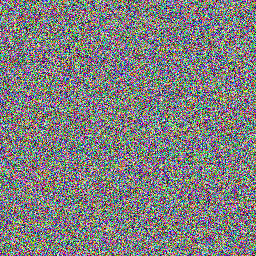

'Image at step 2'

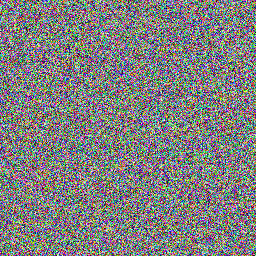

'Image at step 3'

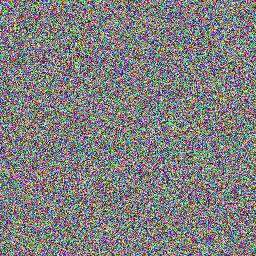

'Image at step 4'

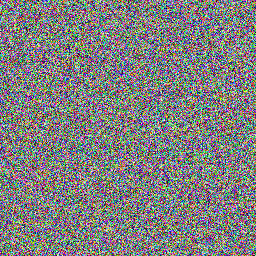

'Image at step 5'

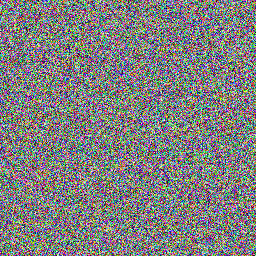

'Image at step 6'

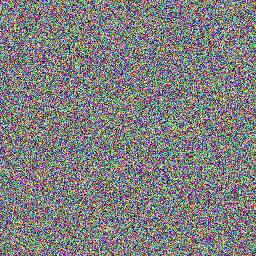

'Image at step 7'

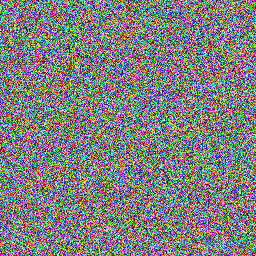

'Image at step 8'

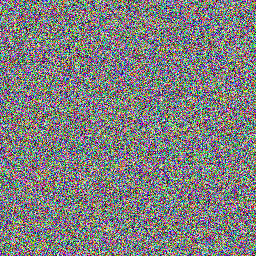

'Image at step 9'

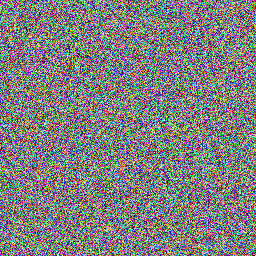

'Image at step 10'

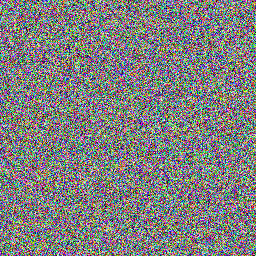

'Image at step 11'

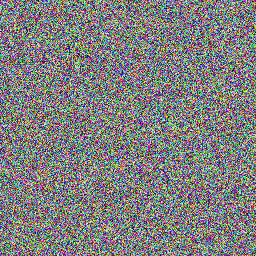

'Image at step 12'

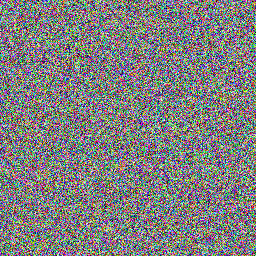

'Image at step 13'

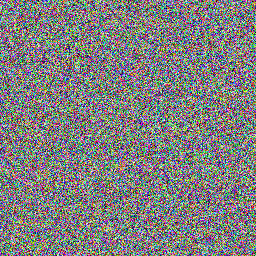

'Image at step 14'

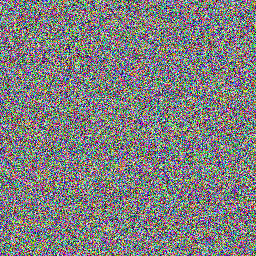

'Image at step 15'

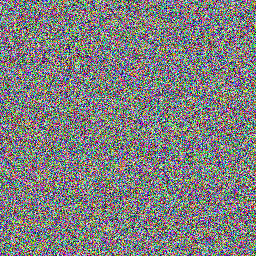

'Image at step 16'

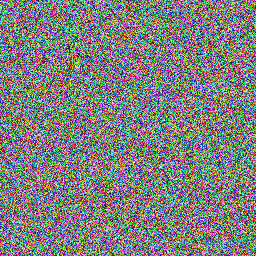

'Image at step 17'

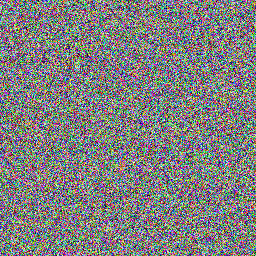

'Image at step 18'

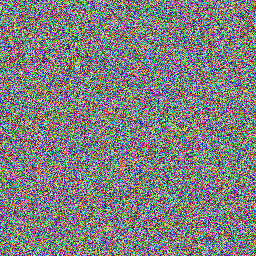

'Image at step 19'

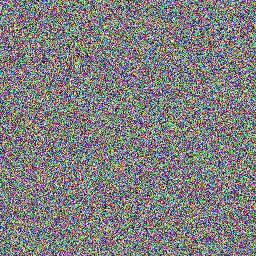

'Image at step 20'

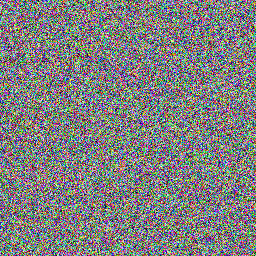

'Image at step 21'

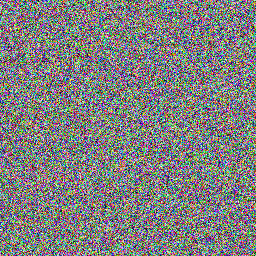

'Image at step 22'

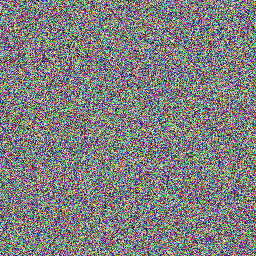

'Image at step 23'

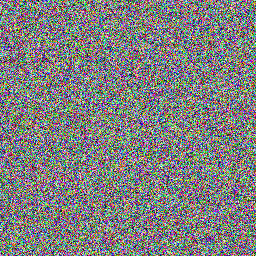

'Image at step 24'

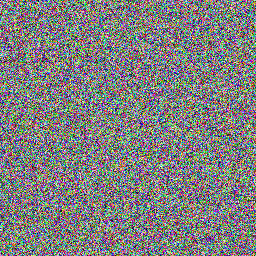

'Image at step 25'

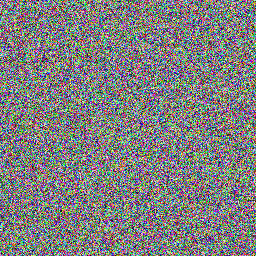

'Image at step 26'

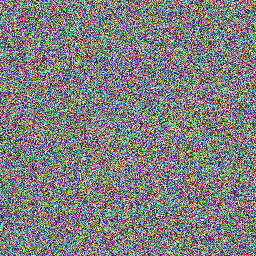

'Image at step 27'

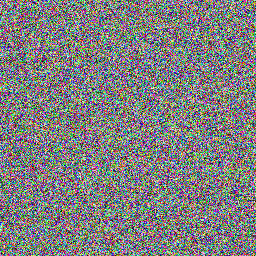

'Image at step 28'

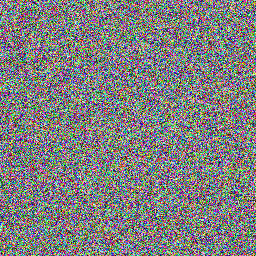

'Image at step 29'

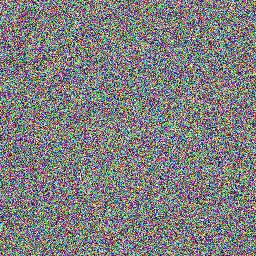

'Image at step 30'

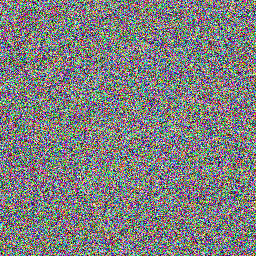

'Image at step 31'

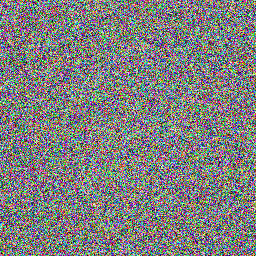

'Image at step 32'

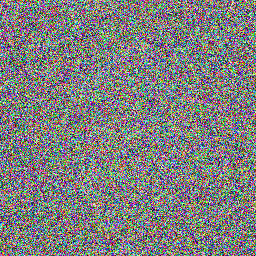

'Image at step 33'

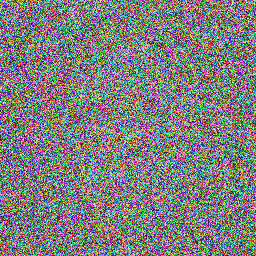

'Image at step 34'

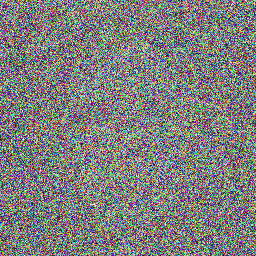

'Image at step 35'

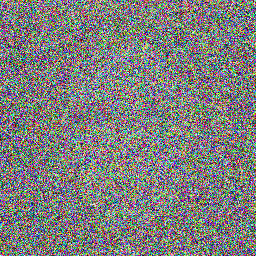

'Image at step 36'

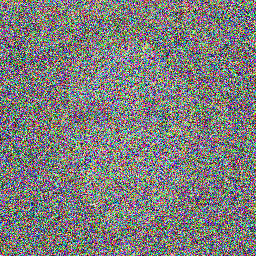

'Image at step 37'

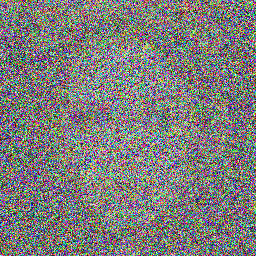

'Image at step 38'

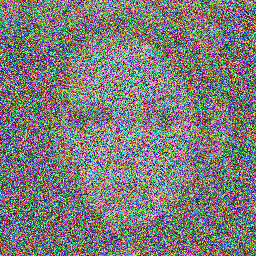

'Image at step 39'

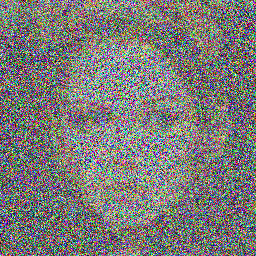

'Image at step 40'

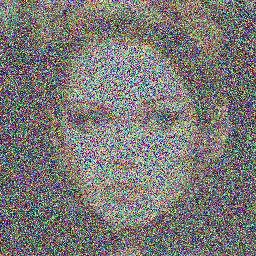

'Image at step 41'

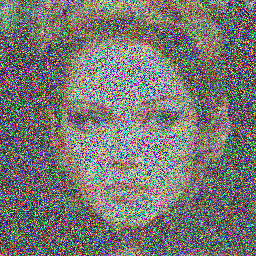

'Image at step 42'

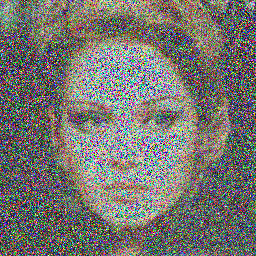

'Image at step 43'

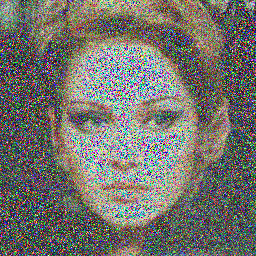

'Image at step 44'

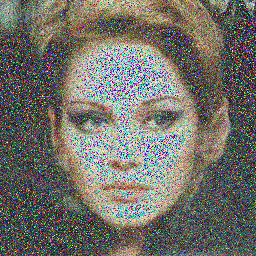

'Image at step 45'

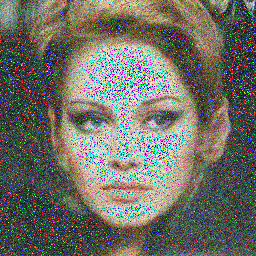

'Image at step 46'

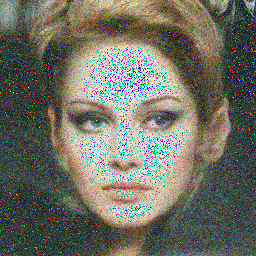

'Image at step 47'

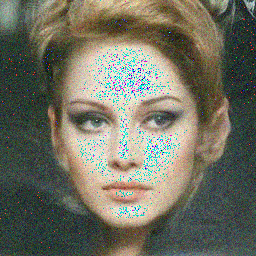

'Image at step 48'

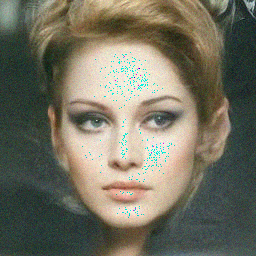

'Image at step 49'

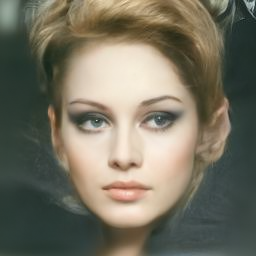

'Image at step 50'

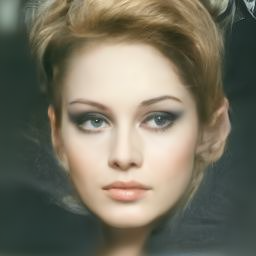

In [ ]:
sample = noisy_sample

for i, t in enumerate(tqdm(ddim_scheduler.timesteps)):
  # 1. predizione del rumore residuale
  with torch.no_grad():
      residual = model(sample, t).sample

  # 2. calcolo dell'immagine meno rumorosa e impostazione x_t -> x_t-1
  sample = ddim_scheduler.step(residual, t, sample).prev_sample

  # 3. mostra l'immagine ogni step
  if (i + 1) % 1 == 0:
      display_sample(sample, i + 1)